<a href="https://colab.research.google.com/github/sorayutmild/ENE461_sorayut/blob/main/ENE461_homework1_week2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Homework 1: Grayscale and Binary Conversion

### นายสรยุทธ มียิ้ม ENE 61070502468 

**Homework 1: Grayscale and Binary Conversion**

Description
1.   Convert original color image to grayscale image,
2.   Plot the image histogram,
3.   Convert to binary image.

## Table of contents:
*   [Load and Read the images](#first-bullet)
*   [ข้อที่ 1 Convert original color image to grayscale image](#second-bullet)
*   [ข้อที่ 2 Plot the image histogram](#third-bullet)
*   [ข้อที่ 3 Convert to binary image](#forth-bullet)
*   [Discussion](#fifth-bullet)





## Load and Read the images <a name="first-bullet"></a>

Read the images without using any special libs such as OpenCV, matplotlib, PIL.

For learning purpose.

In [1]:
import numpy as np # for work with multi-dimensional array
import matplotlib.pyplot as plt # for Read and write images
import glob # for weorking with files

download the free test images from [unsplash](https://unsplash.com/)

In [2]:
!gdown --id 1o7lILwch0TXhHlTPtvWaC2mHXDAqu_BJ
!unzip -q ./testimage_ENE461_homework1.zip

Downloading...
From: https://drive.google.com/uc?id=1o7lILwch0TXhHlTPtvWaC2mHXDAqu_BJ
To: /content/testimage_ENE461_homework1.zip
24.9MB [00:00, 40.6MB/s]


สร้าง class สำหรับทำงานกับรูปภาพ

In [3]:
class workwith_images:
    def __init__(self, images_folder_path, ):
        self.images_folder_path = images_folder_path
        self.images_and_names = self.read_all_images()

    def read_all_images(self):
        images = []
        names = []
        for img_path in glob.glob(self.images_folder_path+'/*'):
            img = plt.imread(img_path)
            images.append(img)
            names.append(img_path.split('/')[-1])
        images_and_names = {'images':images, 'names':names}
        return images_and_names
    
    def show_images(self, images, names):
        for idx, img in enumerate(images):
            plt.title(names[idx])
            plt.axis('off')
            plt.imshow(img, cmap='gray')
            plt.show()
    
    def show_subplot_images(self, images, names,  nrows=2, ncols=4, figsize=(20,10)):
        plt.figure(figsize=figsize)
        for idx, img in enumerate(images):
            plt.subplot(nrows, ncols, idx+1)
            plt.title(names[idx])
            plt.axis('off')
            plt.imshow(img, cmap='gray')
        plt.show()
    
    def show_compare_images(self, images1, images2, title1='', title2='', nrows=8, figsize=(10,40)):
        for row, idx in enumerate(range(0, nrows*2, 2)):
            plt.figure(figsize=figsize)
            plt.subplot(nrows, 2, idx+1)
            plt.axis('off')
            plt.title(title1)
            plt.imshow(images1[row], cmap='gray')

            plt.subplot(nrows, 2, idx+2)
            plt.axis('off')
            plt.title(title2)
            plt.imshow(images2[row], cmap='gray')
            plt.show()

initialize object **my_cv**  and show original images 

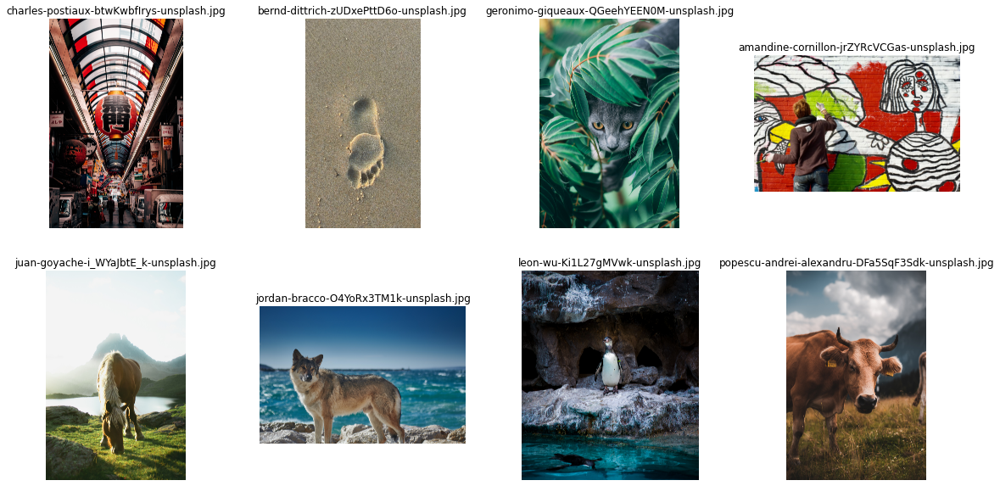

In [4]:
my_cv = workwith_images('./testimage_ENE461_homework1')
images_ori, names = my_cv.images_and_names['images'], my_cv.images_and_names['names']
my_cv.show_subplot_images(images=images_ori, names=names)

## ข้อที่ 1 Convert original color image to grayscale image <a name="second-bullet"></a>


In [5]:
def extract_color_channel(image):
    plt.title('Original image')
    plt.imshow(image)
    plt.axis('off')
    plt.show()

    plt.figure(figsize=(10,10))
    red = image[:, :, 0]
    plt.subplot(1,3,1)
    plt.title('Red channel')
    plt.axis('off')
    plt.imshow(red, cmap='gray')

    green = image[:, :, 1]
    plt.subplot(1,3,2)
    plt.title('Green channel')
    plt.axis('off')
    plt.imshow(green, cmap='gray')
    
    blue = image[:, :, 2]
    plt.subplot(1,3,3)
    plt.title('Blue channel')
    plt.axis('off')
    plt.imshow(blue, cmap='gray')

show the image for each color channel.

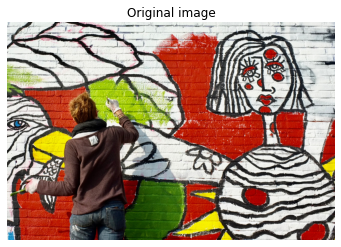

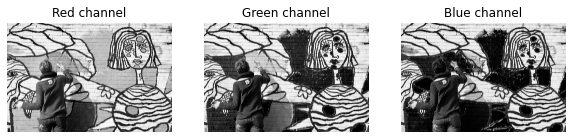

In [6]:
extract_color_channel(images_ori[3])

Convert Color images to Gray images. Using the equation below.

$Gray = 0.3\color{red}{Red} + 0.59\color{green}{Green} + 0.11\color{blue}{Blue}$


In [7]:
def color_to_gray(images, red_coef=0.3, green_coef=0.59, blue_coef=0.11):
    gray_images = []
    for img in images:
        red = img[:, :, 0]
        green = img[:, :, 1]
        blue = img[:, :, 2]
        gray = red_coef*red + green_coef*green + blue_coef*blue
        gray_images.append(gray)
    return gray_images

my_cv.color_to_gray = color_to_gray

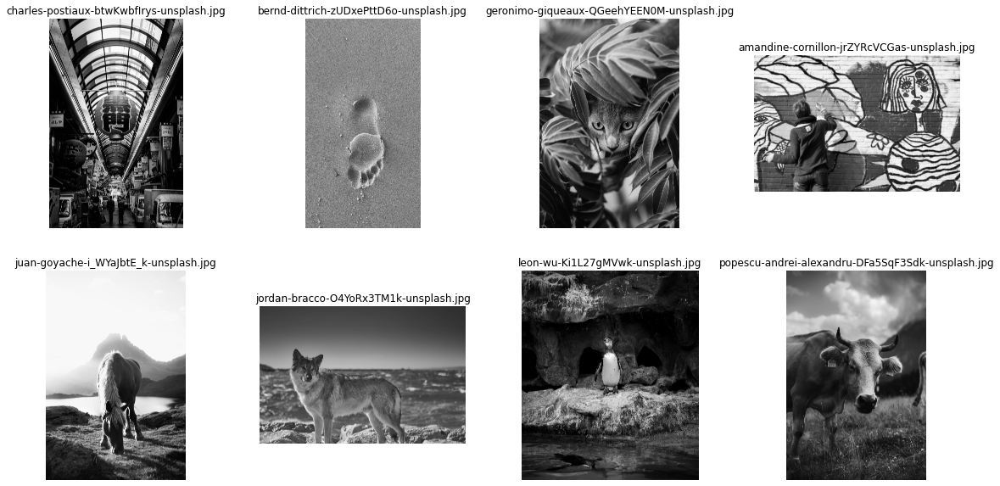

In [8]:
gray_images = my_cv.color_to_gray(images=images_ori)
my_cv.show_subplot_images(gray_images, names=names)

Compare between original image and gray scale image.

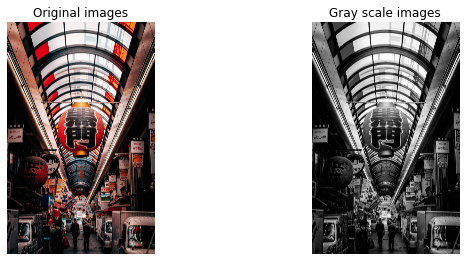

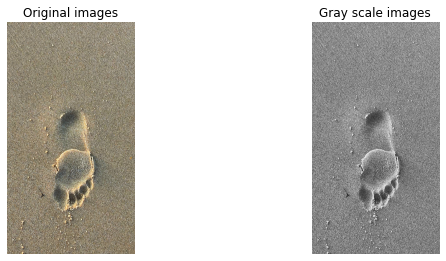

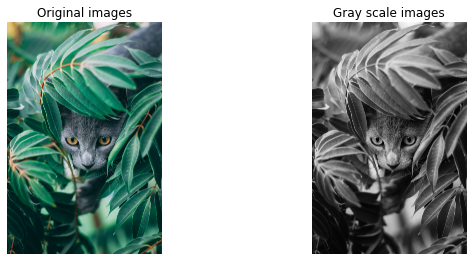

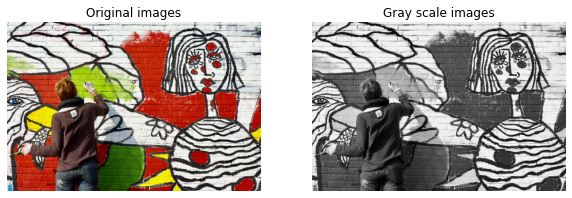

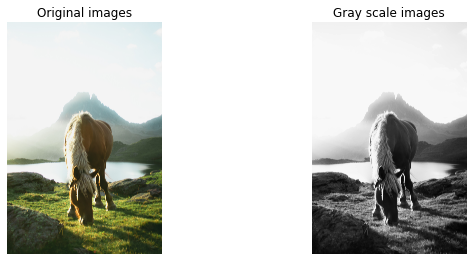

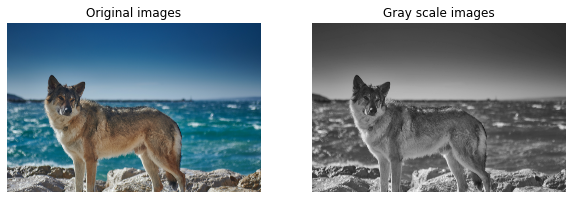

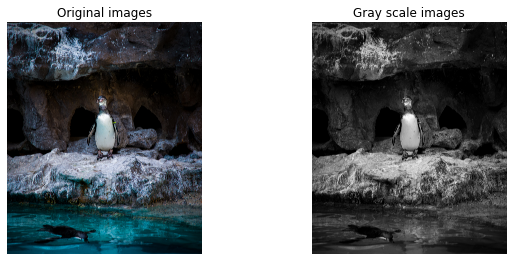

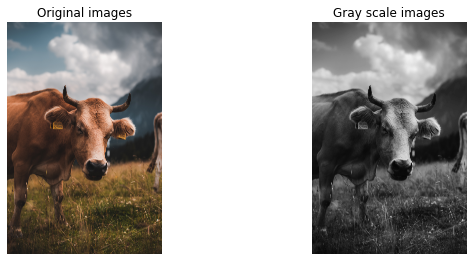

In [9]:
my_cv.show_compare_images(images1=images_ori, images2=gray_images, title1='Original images', title2='Gray scale images')

## ข้อที่ 2 Plot the image histogram <a name="third-bullet"></a>


In [ ]:
# for idx, gi in enumerate(gray_images):
#     plt.title(names[idx])
#     plt.xlabel('Intensity')
#     plt.ylabel('Number of Pixel')
#     plt.hist(gi.flatten(), 128)
#     plt.show()

In [11]:
def show_images_and_hist(images, thresholds=[], figsize=(20,20)):
    gray_images = my_cv.color_to_gray(images)
    for row, idx in enumerate(range(0, len(images)*2, 2)):
        plt.figure(figsize=figsize)
        plt.subplot(len(images), 2, idx+1)
        plt.axis('off')
        plt.imshow(images[row], cmap='gray')

        plt.subplot(len(images), 2, idx+2)
        # plt.axis('off')
        plt.title(names[row])
        plt.xlabel('Intensity')
        plt.ylabel('Number of Pixel')
        plt.hist(gray_images[row].flatten(), 128)
        if len(thresholds) == len(images):
            plt.axvline(thresholds[row], 0, 1, label='pyplot vertical line', color='r')
        plt.show()

my_cv.show_images_and_hist = show_images_and_hist

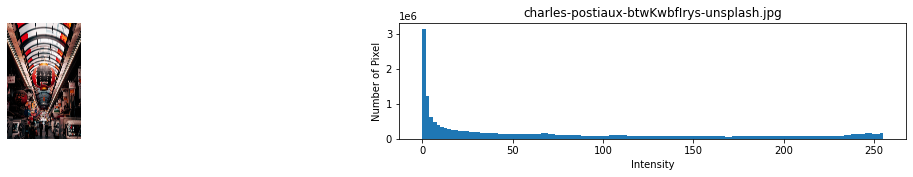

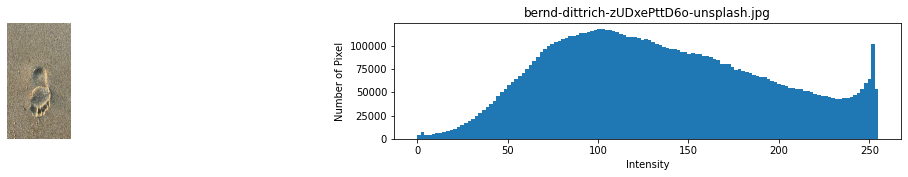

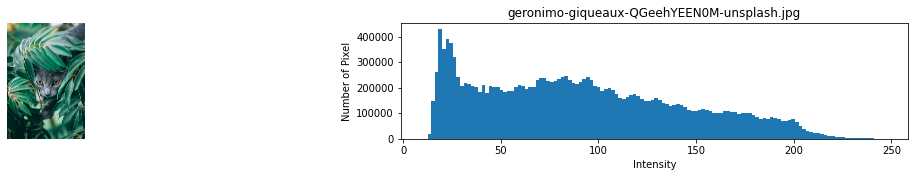

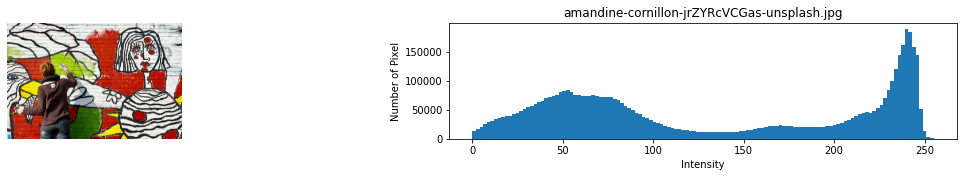

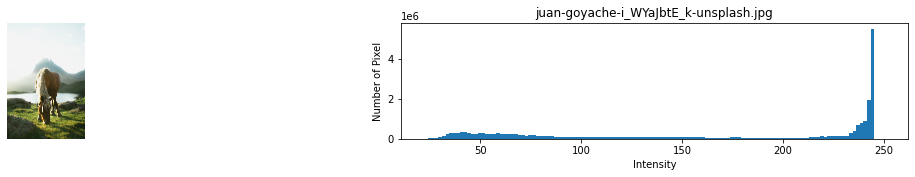

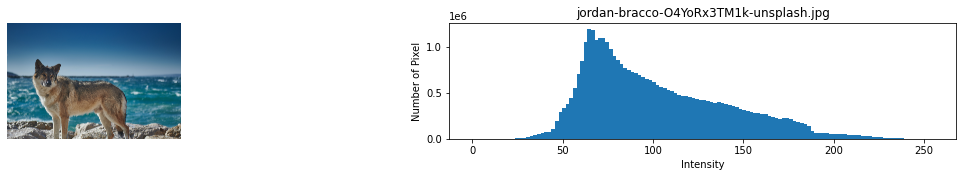

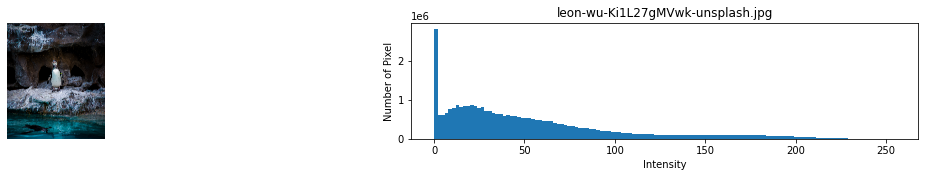

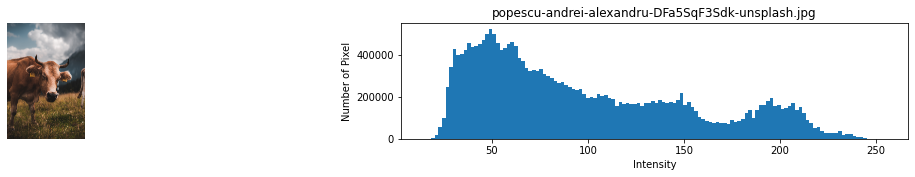

In [12]:
my_cv.show_images_and_hist(images_ori)

## ข้อที่ 3 Convert to binary image <a name="forth-bullet"></a>

Define threshold values in each images by estimate from histogram.

In [13]:
#@title Number fields
t1 =  30#@param {type:"number", min:0, max:255, step:1}
t2 =  125#@param {type:"number", min:0, max:255, step:1}
t3 =  100#@param {type:"number", min:0, max:255, step:1}
t4 =  125#@param {type:"number", min:0, max:255, step:1}
t5 =  225#@param {type:"number", min:0, max:255, step:1}
t6 =  100#@param {type:"number", min:0, max:255, step:1}
t7 =  40#@param {type:"number", min:0, max:255, step:1}
t8 =  100#@param {type:"number", min:0, max:255, step:1}

In [14]:
thresholds = [t1,t2,t3,t4,t5,t6,t7,t8]
thresholds

[30, 125, 100, 125, 225, 100, 40, 100]

Show images and its histograms.
The red line is the defined threshold.

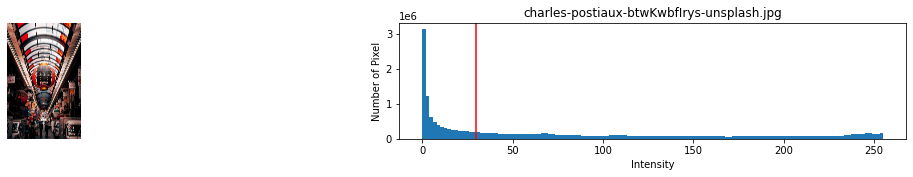

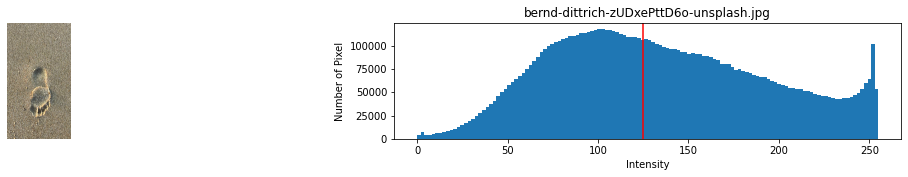

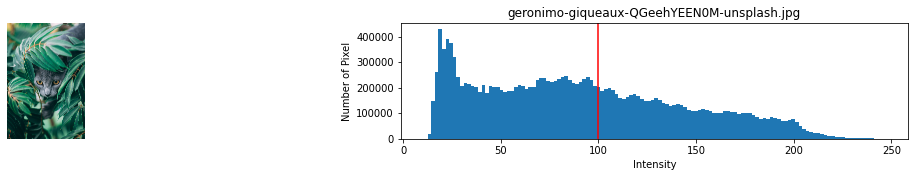

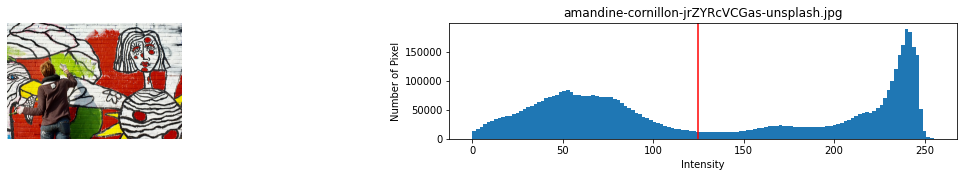

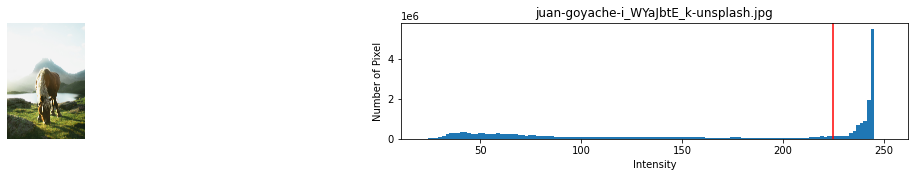

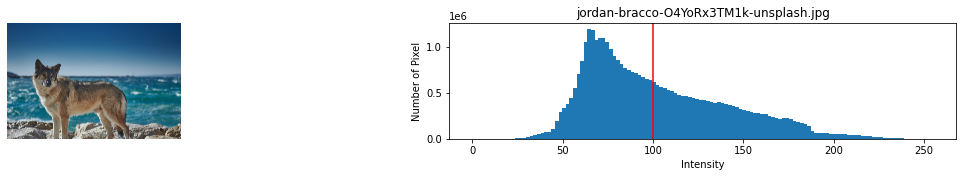

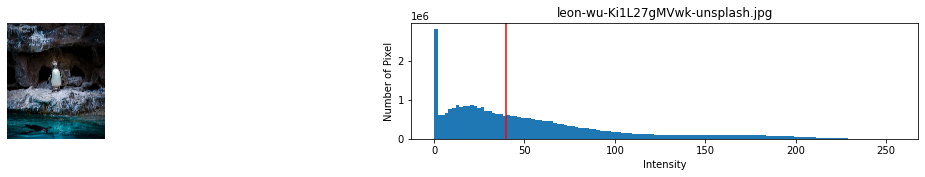

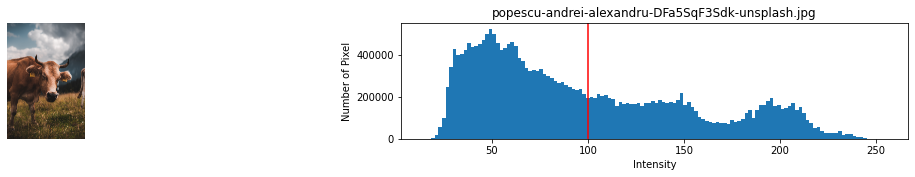

In [15]:
my_cv.show_images_and_hist(images_ori, thresholds)

In [16]:
def gray_to_binary(gray_images, names=names):
    binary_images = []
    for idx, gi in enumerate(gray_images):
        binary_image = np.where(gi < thresholds[idx], 0, 1)
        binary_images.append(binary_image)
    return binary_images

my_cv.gray_to_binary = gray_to_binary

Convert gray-scale images to binary images using defined threshold.

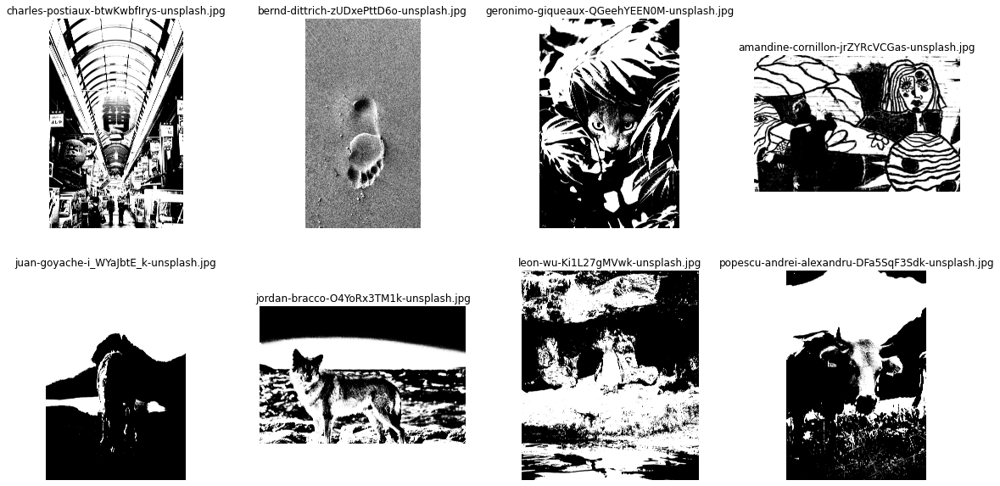

In [17]:
binary_images = my_cv.gray_to_binary(gray_images)
my_cv.show_subplot_images(binary_images, names=names)

Compare original images and its binary images.

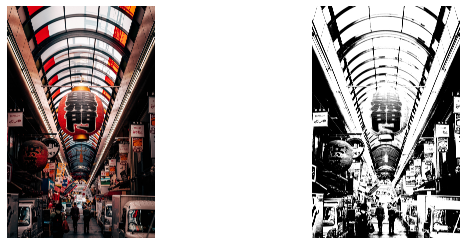

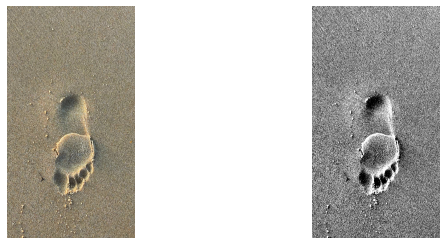

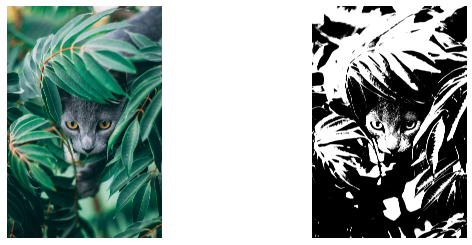

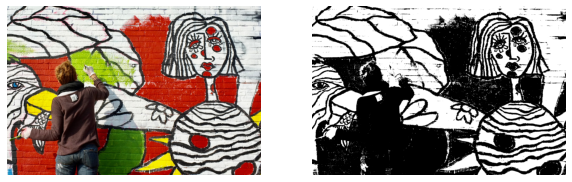

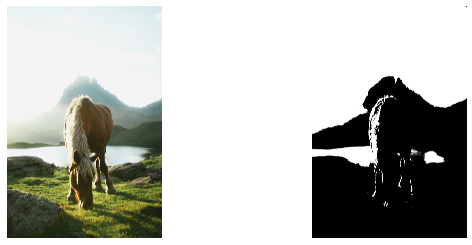

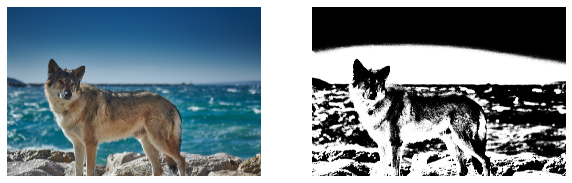

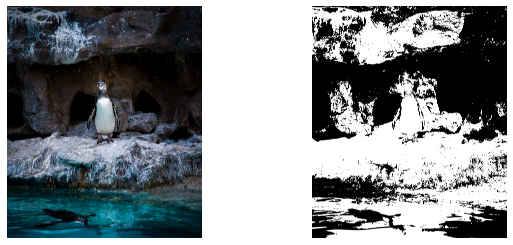

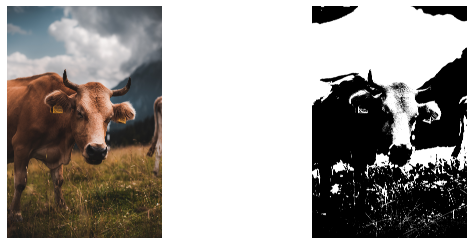

In [18]:
my_cv.show_compare_images(images1=images_ori, images2=binary_images)

## Discussion <a name="fifth-bullet"></a>

### Gray-scale images

เปรียบเทียบ gray scale images ที่ได้จากการใช้สูตร $Gray = 0.3\color{red}{Red} + 0.59\color{green}{Green} + 0.11\color{blue}{Blue}$
กับรูปที่ได้จาก **opencv.cvtColor()**

In [19]:
import cv2

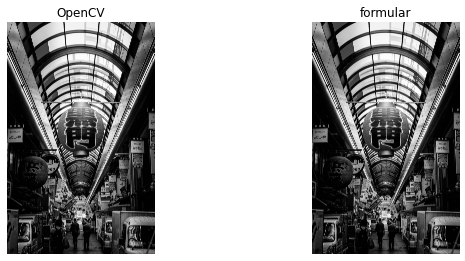

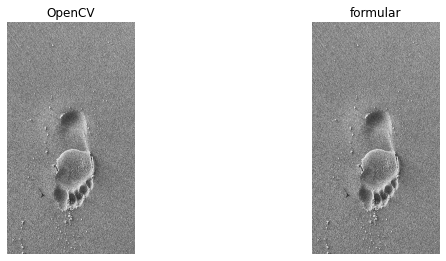

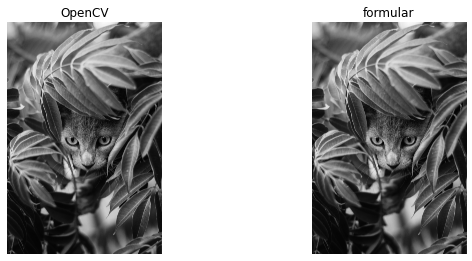

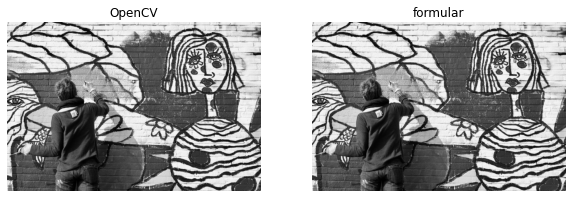

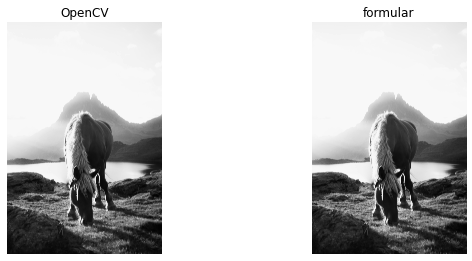

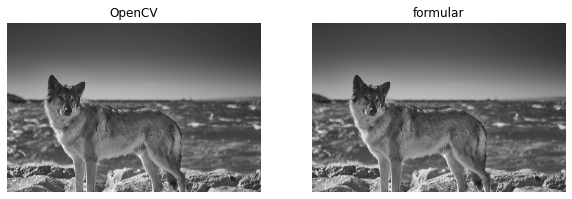

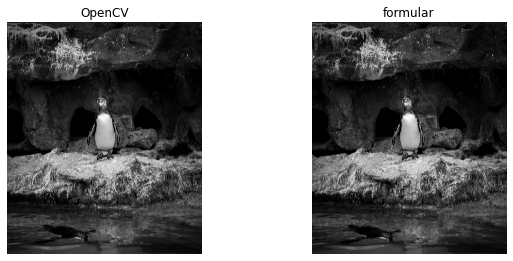

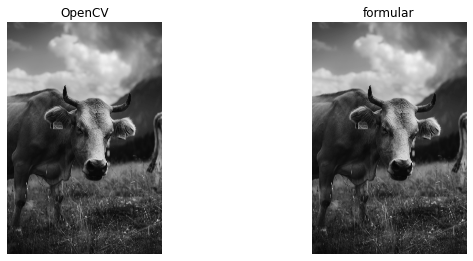

In [20]:
gray_images_opencv = []
for img in images_ori:
    gray_images_opencv.append(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))
    
my_cv.show_compare_images(gray_images_opencv, gray_images, title1='OpenCV', title2='formular')

จะสังเกตุเห็นได้ว่า ผลลัพธ์ที่ได้จากการใช้สูตร $Gray = 0.3\color{red}{Red} + 0.59\color{green}{Green} + 0.11\color{blue}{Blue}$ กับผลลัพธ์ที่ได้จาก Opencv library [Color conversion](https://docs.opencv.org/3.4/de/d25/imgproc_color_conversions.html) มีความใกล้เคียงกัน

เนื่องจากว่า OpenCV ก็ได้ใช้สูตรที่ใกล้เคียงกัน คือ $Gray = 0.299\color{red}{Red} + 0.587\color{green}{Green} + 0.114\color{blue}{Blue}$

โดยค่าสัมประสิทธิ์ของแต่ละสีนั้น ได้มาจากสายของมนุษย์เหมาะสมกับค่านี้มากที่สุด

ทดลองเปลี่ยนให้ค่าสัมประสิทธิ์ของสีฟ้ามากที่สุด รองลงมาเป็นสีแดง และน้อยที่สุดเป็นสีเขียว

In [21]:
#@title Number fields
test_red_coef =  0.2#@param {type:"number", min:0, max:255, step:1}
test_green_coef =  0.15#@param {type:"number", min:0, max:255, step:1}
test_blue_coef =  0.65#@param {type:"number", min:0, max:255, step:1}

Show รูปภาพที่เปลี่ยนค่าสัมประสิทธิ์ของสีฟ้ามากที่สุด รองลงมาเป็นสีแดง และน้อยที่สุดเป็นสีเขียว

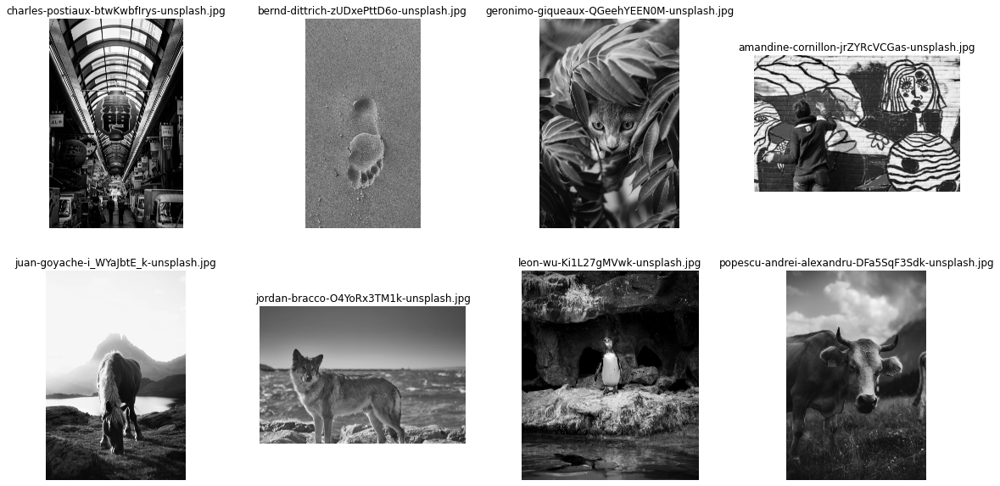

In [22]:
test_gray_images = my_cv.color_to_gray(images_ori, red_coef=test_red_coef, green_coef=test_green_coef, blue_coef=test_blue_coef)
my_cv.show_subplot_images(test_gray_images, names=names)

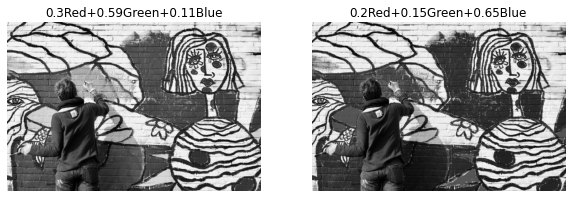

In [23]:
which_images = 3 # choose image

plt.figure(figsize=(10,10))
plt.subplot(1, 2, 1)
plt.imshow(gray_images[which_images], cmap='gray')
plt.axis('off')
plt.title('0.3Red+0.59Green+0.11Blue')
plt.subplot(1, 2, 2)
plt.imshow(test_gray_images[which_images], cmap='gray')
plt.axis('off')
plt.title('0.2Red+0.15Green+0.65Blue')
plt.show()

จะพบว่ารูปที่ได้ยังเป็นรูปภาพ gray-scale อยู่ แต่จะแตกต่างไปจากเดิม

### Binary images

จาก [OpenCV tutorial เรื่อง image thresholding](https://docs.opencv.org/4.5.1/d7/d4d/tutorial_py_thresholding.html) เขาได้นำเสนอวิธีทำ image thresholding 3 แบบ คือ
* **simple thresholding** -> เลือก threshold เอง และใช้ค่าเท่ากันกับทุก pixel
* **adaptive thresholding** -> the algorithm determines the threshold for a pixel based on a small region around it.
* **Otsu's thresholding** -> เลือกค่า threshold แบบอัตโนมัติ โดยใช้ Otsu algorithm

#### Otsu's Binarization
เป็นไปตามสมการด้านล่าง

$\sigma_w^2(t) = q_1(t)\sigma_1^2(t)+q_2(t)\sigma_2^2(t)
$

โดยที่

$q_1(t) = \sum_{i=1}^{t} P(i) \quad \& \quad q_2(t) = \sum_{i=t+1}^{I} P(i)$

$\mu_1(t) = \sum_{i=1}^{t} \frac{iP(i)}{q_1(t)} \quad \& \quad \mu_2(t) = \sum_{i=t+1}^{I} \frac{iP(i)}{q_2(t)}$

$\sigma_1^2(t) = \sum_{i=1}^{t} [i-\mu_1(t)]^2 \frac{P(i)}{q_1(t)} \quad \&$
$\quad \sigma_2^2(t) = \sum_{i=t+1}^{I} [i-\mu_2(t)]^2 \frac{P(i)}{q_2(t)}$


Show the images and its thresholding. When using otsu algorithm

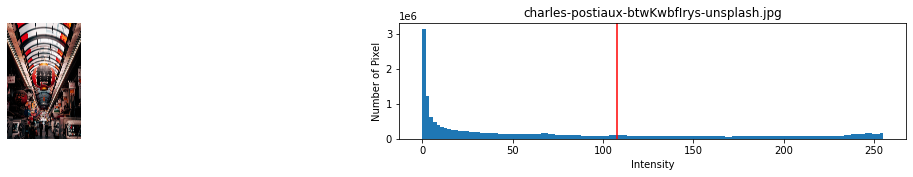

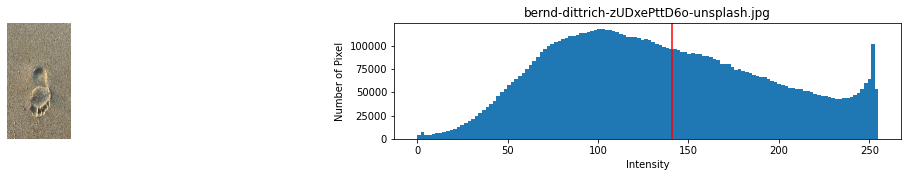

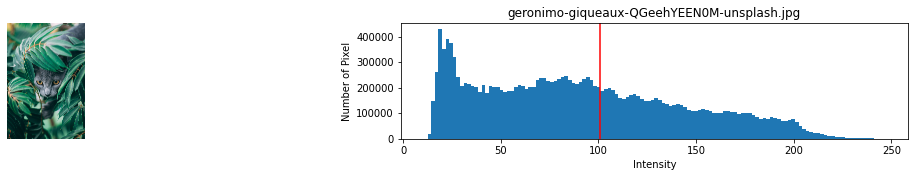

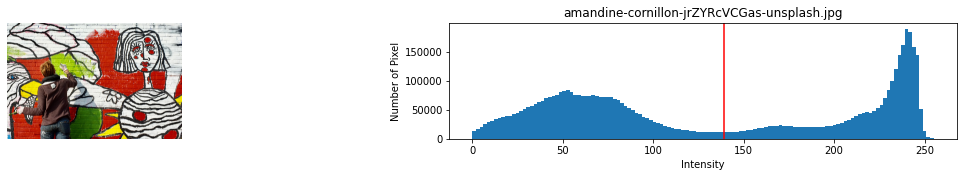

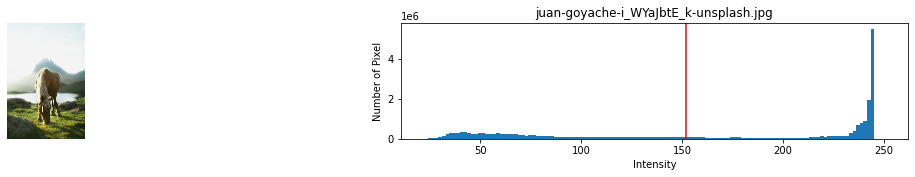

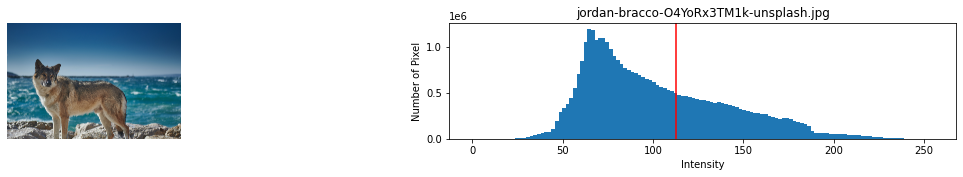

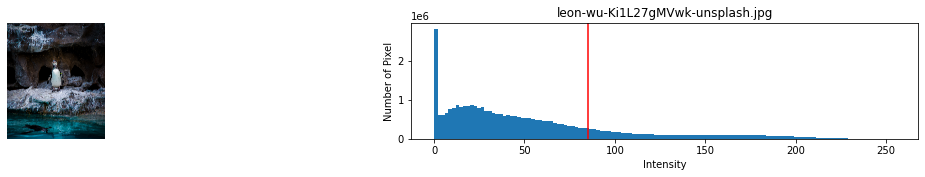

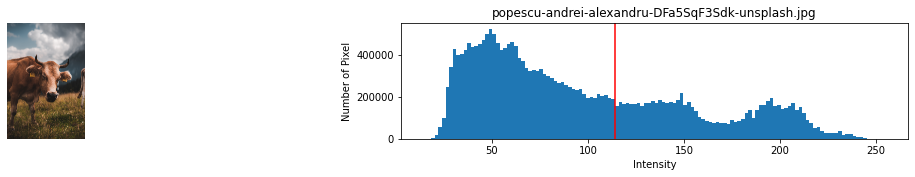

In [24]:
thres_otsu_of_images = []
bn_otsu_images = []

for opencv_gray_img in gray_images_opencv:
    thres_otsu, bn_otsu = cv2.threshold(opencv_gray_img, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    thres_otsu_of_images.append(thres_otsu)
    bn_otsu_images.append(bn_otsu)

my_cv.show_images_and_hist(images_ori, thres_otsu_of_images)

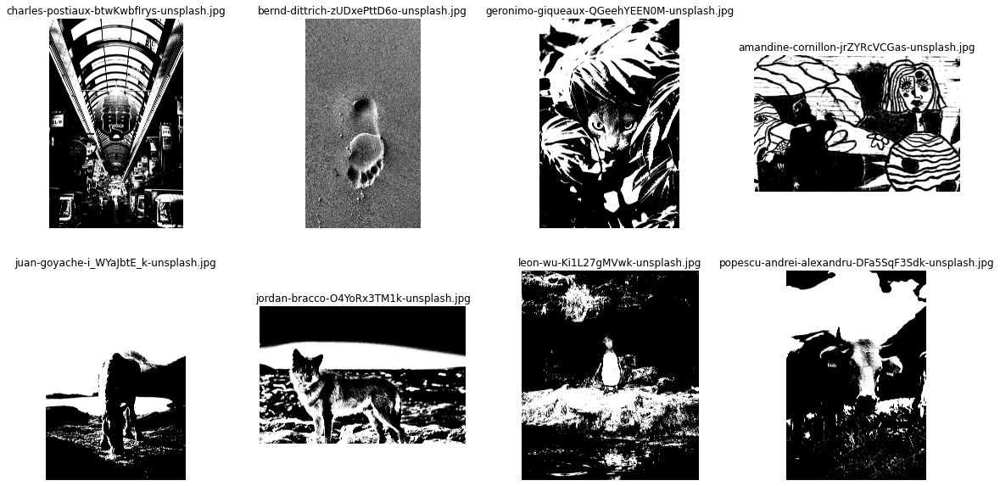

In [25]:
 my_cv.show_subplot_images(bn_otsu_images, names=names)

In [28]:
print('thresholds by hand: \n', thresholds)
print('threshold by otsu openCV: \n', thres_otsu_of_images)

thresholds by hand: 
 [30, 125, 100, 125, 225, 100, 40, 100]
threshold by otsu openCV: 
 [108.0, 141.0, 101.0, 139.0, 152.0, 113.0, 85.0, 114.0]


พบว่าค่า threshold ของแต่ะรูปที่ได้จากการเลือกเองโดยสายตากับ otsu algorithm แตกต่างกัน

เปรียบเทียบ รูปภาพ binary ที่ใช้ threshold จากการเลือกเอง และจาก otsu algorithm

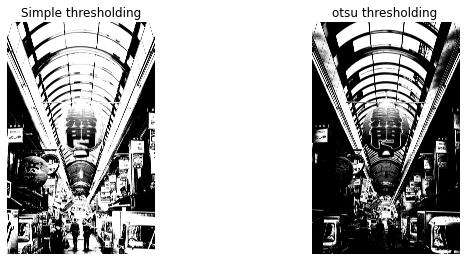

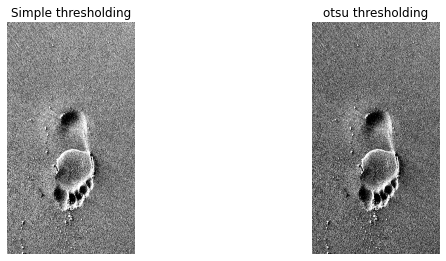

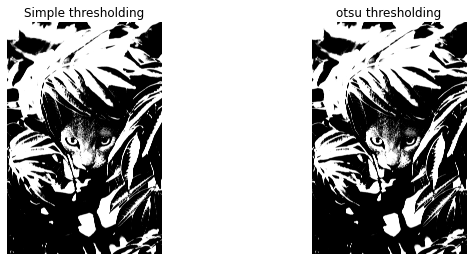

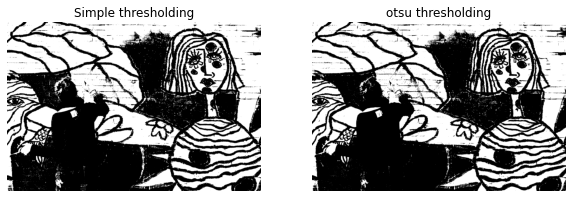

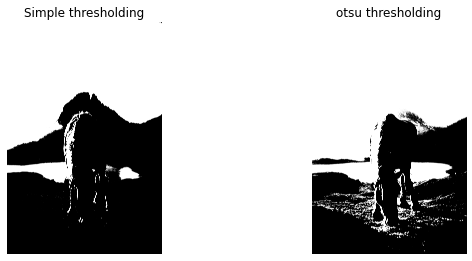

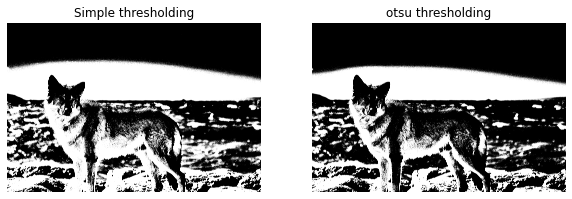

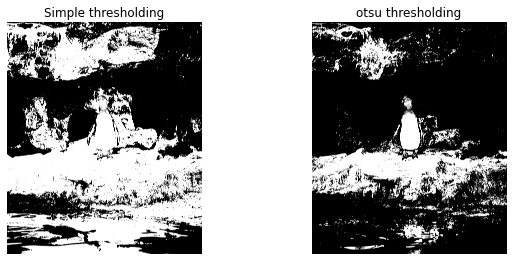

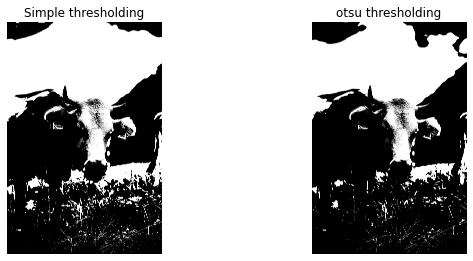

In [29]:
my_cv.show_compare_images(binary_images, bn_otsu_images, title1='Simple thresholding', title2='otsu thresholding')

จะเห็นได้ว่าภาพที่ได้จาก otsu ส่วนใหญ่จะมี information มากกว่า